# Imports

In [2]:
import seaborn as sns
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import xgboost as xgb
import plotly.express as px
from pandas import DataFrame
from IPython.display import HTML
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics 
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score, precision_score, accuracy_score, recall_score, balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import GaussianNB

# Loading dataset (Train+Test)

In [3]:
train = pd.read_csv(r"Dataset\NSL-KDD\KDDTrain+.txt")

In [4]:
test = pd.read_csv(r"Dataset\NSL-KDD\KDDTest+.txt")

# Overview of the dataset

In [5]:
print ("Read {} rows.".format(len(train)))

Read 125972 rows.


In [6]:
train.shape

(125972, 43)

In [7]:
print ("Read {} rows.".format(len(test)))

Read 22543 rows.


In [8]:
test.shape

(22543, 43)

# Add header

In [9]:
train.columns = [
    'duration',
    'protocol_type',
    'service',
    'flag',
    'src_bytes',
    'dst_bytes',
    'land',
    'wrong_fragment',
    'urgent',
    'hot',
    'num_failed_logins',
    'logged_in',
    'num_compromised',
    'root_shell',
    'su_attempted',
    'num_root',
    'num_file_creations',
    'num_shells',
    'num_access_files',
    'num_outbound_cmds',
    'is_host_login',
    'is_guest_login',
    'count',
    'srv_count',
    'serror_rate',
    'srv_serror_rate',
    'rerror_rate',
    'srv_rerror_rate',
    'same_srv_rate',
    'diff_srv_rate',
    'srv_diff_host_rate',
    'dst_host_count',
    'dst_host_srv_count',
    'dst_host_same_srv_rate',
    'dst_host_diff_srv_rate',
    'dst_host_same_src_port_rate',
    'dst_host_srv_diff_host_rate',
    'dst_host_serror_rate',
    'dst_host_srv_serror_rate',
    'dst_host_rerror_rate',
    'dst_host_srv_rerror_rate',
    'label',
    'difficulty_level'
]

In [10]:
train.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'label', 'difficulty_level'],
      dtype='object')

In [11]:
test.columns = [
    'duration',
    'protocol_type',
    'service',
    'flag',
    'src_bytes',
    'dst_bytes',
    'land',
    'wrong_fragment',
    'urgent',
    'hot',
    'num_failed_logins',
    'logged_in',
    'num_compromised',
    'root_shell',
    'su_attempted',
    'num_root',
    'num_file_creations',
    'num_shells',
    'num_access_files',
    'num_outbound_cmds',
    'is_host_login',
    'is_guest_login',
    'count',
    'srv_count',
    'serror_rate',
    'srv_serror_rate',
    'rerror_rate',
    'srv_rerror_rate',
    'same_srv_rate',
    'diff_srv_rate',
    'srv_diff_host_rate',
    'dst_host_count',
    'dst_host_srv_count',
    'dst_host_same_srv_rate',
    'dst_host_diff_srv_rate',
    'dst_host_same_src_port_rate',
    'dst_host_srv_diff_host_rate',
    'dst_host_serror_rate',
    'dst_host_srv_serror_rate',
    'dst_host_rerror_rate',
    'dst_host_srv_rerror_rate',
    'label',
    'difficulty_level'
]

In [12]:
test.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'label', 'difficulty_level'],
      dtype='object')

# Removing unnecessary columns

In [13]:
del train["difficulty_level"] 
del test["difficulty_level"]
del train["num_outbound_cmds"] 
del test["num_outbound_cmds"]

In [14]:
train.shape

(125972, 41)

In [15]:
test.shape

(22543, 41)

# Data exploration

In [16]:
train.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
125967,0,tcp,private,S0,0,0,0,0,0,0,...,25,0.10,0.06,0.00,0.0,1.00,1.0,0.00,0.0,neptune
125968,8,udp,private,SF,105,145,0,0,0,0,...,244,0.96,0.01,0.01,0.0,0.00,0.0,0.00,0.0,normal
125969,0,tcp,smtp,SF,2231,384,0,0,0,0,...,30,0.12,0.06,0.00,0.0,0.72,0.0,0.01,0.0,normal
125970,0,tcp,klogin,S0,0,0,0,0,0,0,...,8,0.03,0.05,0.00,0.0,1.00,1.0,0.00,0.0,neptune
125971,0,tcp,ftp_data,SF,151,0,0,0,0,0,...,77,0.30,0.03,0.30,0.0,0.00,0.0,0.00,0.0,normal


In [17]:
print (len(pd.unique(train['label'])))

23


In [18]:
train['label'].value_counts()

label
normal             67342
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  18
imap                  11
rootkit               10
loadmodule             9
ftp_write              8
multihop               7
phf                    4
perl                   3
spy                    2
Name: count, dtype: int64

In [19]:
px.histogram(data_frame=train, x='label', color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [20]:
px.histogram(data_frame=train,x='protocol_type',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [21]:
px.histogram(data_frame=train,x='service',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [22]:
test.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
22538,0,tcp,smtp,SF,794,333,0,0,0,0,...,141,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal
22539,0,tcp,http,SF,317,938,0,0,0,0,...,255,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal
22540,0,tcp,http,SF,54540,8314,0,0,0,2,...,255,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,back
22541,0,udp,domain_u,SF,42,42,0,0,0,0,...,252,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,normal
22542,0,tcp,sunrpc,REJ,0,0,0,0,0,0,...,21,0.08,0.03,0.00,0.00,0.00,0.0,0.44,1.00,mscan


In [23]:
print (len(pd.unique(test['label'])))

38


In [24]:
test['label'].value_counts()

label
normal             9711
neptune            4656
guess_passwd       1231
mscan               996
warezmaster         944
apache2             737
satan               735
processtable        685
smurf               665
back                359
snmpguess           331
saint               319
mailbomb            293
snmpgetattack       178
portsweep           157
ipsweep             141
httptunnel          133
nmap                 73
pod                  41
buffer_overflow      20
multihop             18
named                17
ps                   15
sendmail             14
xterm                13
rootkit              13
teardrop             12
xlock                 9
land                  7
xsnoop                4
ftp_write             3
loadmodule            2
worm                  2
perl                  2
sqlattack             2
udpstorm              2
phf                   2
imap                  1
Name: count, dtype: int64

In [25]:
px.histogram(data_frame=test, x='label', color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [26]:
px.histogram(data_frame=test,x='protocol_type',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [27]:
px.histogram(data_frame=test,x='service',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

# Data encoding

In [28]:
train.dtypes

duration                         int64
protocol_type                   object
service                         object
flag                            object
src_bytes                        int64
dst_bytes                        int64
land                             int64
wrong_fragment                   int64
urgent                           int64
hot                              int64
num_failed_logins                int64
logged_in                        int64
num_compromised                  int64
root_shell                       int64
su_attempted                     int64
num_root                         int64
num_file_creations               int64
num_shells                       int64
num_access_files                 int64
is_host_login                    int64
is_guest_login                   int64
count                            int64
srv_count                        int64
serror_rate                    float64
srv_serror_rate                float64
rerror_rate              

In [29]:
train['protocol_type'].value_counts()

protocol_type
tcp     102688
udp      14993
icmp      8291
Name: count, dtype: int64

In [30]:
train['protocol_type']=train['protocol_type'].replace({'tcp' : 0, 'udp' : 1 ,'icmp': 2})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\3252136462.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [31]:
train['protocol_type'].value_counts()

protocol_type
0    102688
1     14993
2      8291
Name: count, dtype: int64

In [32]:
train.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
125967,0,0,private,S0,0,0,0,0,0,0,...,25,0.10,0.06,0.00,0.0,1.00,1.0,0.00,0.0,neptune
125968,8,1,private,SF,105,145,0,0,0,0,...,244,0.96,0.01,0.01,0.0,0.00,0.0,0.00,0.0,normal
125969,0,0,smtp,SF,2231,384,0,0,0,0,...,30,0.12,0.06,0.00,0.0,0.72,0.0,0.01,0.0,normal
125970,0,0,klogin,S0,0,0,0,0,0,0,...,8,0.03,0.05,0.00,0.0,1.00,1.0,0.00,0.0,neptune
125971,0,0,ftp_data,SF,151,0,0,0,0,0,...,77,0.30,0.03,0.30,0.0,0.00,0.0,0.00,0.0,normal


In [33]:
test['protocol_type'].value_counts()

protocol_type
tcp     18879
udp      2621
icmp     1043
Name: count, dtype: int64

In [34]:
test['protocol_type']=test['protocol_type'].replace({'tcp' : 0, 'udp' : 1 ,'icmp': 2})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\2351971875.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [35]:
test['protocol_type'].value_counts()

protocol_type
0    18879
1     2621
2     1043
Name: count, dtype: int64

In [36]:
test.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
22538,0,0,smtp,SF,794,333,0,0,0,0,...,141,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal
22539,0,0,http,SF,317,938,0,0,0,0,...,255,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal
22540,0,0,http,SF,54540,8314,0,0,0,2,...,255,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,back
22541,0,1,domain_u,SF,42,42,0,0,0,0,...,252,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,normal
22542,0,0,sunrpc,REJ,0,0,0,0,0,0,...,21,0.08,0.03,0.00,0.00,0.00,0.0,0.44,1.00,mscan


In [37]:
print (len(pd.unique(train['service'])))

70


In [38]:
HTML(DataFrame(train['service'].value_counts()).to_html())

,count
service,
http,40338
private,21853
domain_u,9043
smtp,7313
ftp_data,6859
eco_i,4586
other,4359
ecr_i,3077
telnet,2353


In [39]:
train['service']=train['service'].replace({'http' : 0, 'private' : 1, 'domain_u' : 2, 'smtp' : 3, 'ftp_data' : 4, 'eco_i' : 5, 'other' : 6, 'ecr_i' : 7, 'telnet' : 8, 'finger' : 9, 'ftp' : 10, 'auth' : 11, 'Z39_50' : 12, 'uucp' : 13, 'courier' : 14, 'bgp' : 15, 'whois' : 16, 'uucp_path' : 17, 'iso_tsap' : 18, 'time' : 19, 'imap4' : 20, 'nnsp' : 21, 'vmnet' : 22, 'urp_i' : 23, 'domain' : 24, 'ctf' : 25, 'csnet_ns' : 26, 'supdup' : 27, 'discard' : 28, 'http_443' : 29, 'daytime' : 30, 'gopher' : 31, 'efs' : 32, 'systat' : 33, 'link' : 34, 'exec' : 35, 'hostnames' : 36, 'name' : 37, 'mtp' : 38, 'echo' : 39, 'klogin' : 40, 'login' : 41, 'ldap' : 42, 'netbios_dgm' : 43, 'sunrpc' : 44, 'netbios_ssn' : 45, 'netstat' : 46, 'netbios_ns' : 47, 'ssh' : 48, 'kshell' : 49, 'nntp' : 50, 'pop_3' : 51, 'sql_net' : 52, 'IRC' : 53, 'ntp_u' : 54, 'rje' : 55, 'pop_2' : 56, 'remote_job' : 57, 'X11' : 58, 'printer' : 59, 'shell' : 60, 'urh_i' : 61, 'tim_i' : 62, 'red_i' : 63, 'pm_dump' : 64, 'tftp_u' : 65, 'harvest' : 66, 'aol' : 67, 'http_8001' : 68, 'http_2784' : 69})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\1386872373.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [40]:
HTML(DataFrame(train['service'].value_counts()).to_html())

,count
service,
0,40338
1,21853
2,9043
3,7313
4,6859
5,4586
6,4359
7,3077
8,2353


In [41]:
print (len(pd.unique(test['service'])))

64


In [42]:
HTML(DataFrame(test['service'].value_counts()).to_html())

,count
service,
http,7853
private,4773
telnet,1626
pop_3,1019
smtp,934
domain_u,894
ftp_data,851
other,838
ecr_i,752


In [43]:
test['service']=test['service'].replace({'http' : 0, 'private' : 1, 'domain_u' : 2, 'smtp' : 3, 'ftp_data' : 4, 'eco_i' : 5, 'other' : 6, 'ecr_i' : 7, 'telnet' : 8, 'finger' : 9, 'ftp' : 10, 'auth' : 11, 'Z39_50' : 12, 'uucp' : 13, 'courier' : 14, 'bgp' : 15, 'whois' : 16, 'uucp_path' : 17, 'iso_tsap' : 18, 'time' : 19, 'imap4' : 20, 'nnsp' : 21, 'vmnet' : 22, 'urp_i' : 23, 'domain' : 24, 'ctf' : 25, 'csnet_ns' : 26, 'supdup' : 27, 'discard' : 28, 'http_443' : 29, 'daytime' : 30, 'gopher' : 31, 'efs' : 32, 'systat' : 33, 'link' : 34, 'exec' : 35, 'hostnames' : 36, 'name' : 37, 'mtp' : 38, 'echo' : 39, 'klogin' : 40, 'login' : 41, 'ldap' : 42, 'netbios_dgm' : 43, 'sunrpc' : 44, 'netbios_ssn' : 45, 'netstat' : 46, 'netbios_ns' : 47, 'ssh' : 48, 'kshell' : 49, 'nntp' : 50, 'pop_3' : 51, 'sql_net' : 52, 'IRC' : 53, 'ntp_u' : 54, 'rje' : 55, 'pop_2' : 56, 'remote_job' : 57, 'X11' : 58, 'printer' : 59, 'shell' : 60, 'urh_i' : 61, 'tim_i' : 62, 'red_i' : 63, 'pm_dump' : 64, 'tftp_u' : 65, 'harvest' : 66, 'aol' : 67, 'http_8001' : 68, 'http_2784' : 69})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\519986405.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [44]:
HTML(DataFrame(test['service'].value_counts()).to_html())

,count
service,
0,7853
1,4773
8,1626
51,1019
3,934
2,894
4,851
6,838
7,752


In [45]:
print (len(pd.unique(train['flag'])))

11


In [46]:
train['flag'].value_counts()

flag
SF        74944
S0        34851
REJ       11233
RSTR       2421
RSTO       1562
S1          365
SH          271
S2          127
RSTOS0      103
S3           49
OTH          46
Name: count, dtype: int64

In [47]:
train['flag']=train['flag'].replace({'SF' : 0, 'S0' : 1 ,'REJ': 2 ,'RSTR': 3,'RSTO': 4,'S1': 5,'SH': 6,'S2': 7,'RSTOS0': 8,'S3': 9,'OTH': 10})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\3805328248.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [48]:
train['flag'].value_counts()

flag
0     74944
1     34851
2     11233
3      2421
4      1562
5       365
6       271
7       127
8       103
9        49
10       46
Name: count, dtype: int64

In [49]:
print (len(pd.unique(test['flag'])))

11


In [50]:
test['flag'].value_counts()

flag
SF        14875
REJ        3849
S0         2013
RSTO        773
RSTR        669
S3          249
SH           73
S1           21
S2           15
OTH           4
RSTOS0        2
Name: count, dtype: int64

In [51]:
test['flag']=test['flag'].replace({'SF' : 0, 'S0' : 1 ,'REJ': 2 ,'RSTR': 3,'RSTO': 4,'S1': 5,'SH': 6,'S2': 7,'RSTOS0': 8,'S3': 9,'OTH': 10})

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\1043305001.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [52]:
test['flag'].value_counts()

flag
0     14875
2      3849
1      2013
4       773
3       669
9       249
6        73
5        21
7        15
10        4
8         2
Name: count, dtype: int64

# Binary classification (Normal=0, Attaque=1)

In [53]:
HTML(DataFrame(train['label'].value_counts()).to_html())

,count
label,
normal,67342
neptune,41214
satan,3633
ipsweep,3599
portsweep,2931
smurf,2646
nmap,1493
back,956
teardrop,892


In [54]:
train['label']=train['label'].replace({'normal' : 0, 'neptune' : 1, 'guess_passwd' : 1, 'mscan' : 1, 'warezmaster' : 1, 'apache2' : 1, 'satan' : 1, 'processtable' : 1, 'smurf' : 1, 'back' : 1, 'snmpguess' : 1, 'saint' : 1, 'mailbomb' : 1, 'snmpgetattack' : 1, 'portsweep' : 1, 'ipsweep' : 1, 'httptunnel' : 1, 'nmap' : 1, 'pod' : 1, 'buffer_overflow' : 1, 'multihop' : 1, 'named' : 1, 'ps' : 1, 'sendmail' : 1, 'xterm' : 1, 'rootkit' : 1, 'teardrop' : 1, 'xlock' : 1, 'land' : 1, 'xsnoop' : 1, 'ftp_write' : 1, 'loadmodule' : 1, 'worm' : 1, 'udpstorm' : 1, 'sqlattack' : 1, 'perl' : 1, 'phf' : 1, 'imap' : 1, 'spy' : 1, 'warezclient' : 1  })
#train.loc[train['label'] == 'normal', 'label'] = 0
#train.loc[train['label'] != 'normal', 'label'] = 1

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\2251788733.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [55]:
HTML(DataFrame(train['label'].value_counts()).to_html())

,count
label,
0,67342
1,58630


In [56]:
train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,1,6,0,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,0
1,0,0,1,1,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,1
2,0,0,0,0,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,0
3,0,0,0,0,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0
4,0,0,1,2,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,1


In [57]:
HTML(DataFrame(test['label'].value_counts()).to_html())

,count
label,
normal,9711
neptune,4656
guess_passwd,1231
mscan,996
warezmaster,944
apache2,737
satan,735
processtable,685
smurf,665


In [58]:
test['label']=test['label'].replace({'normal' : 0, 'neptune' : 1, 'guess_passwd' : 1, 'mscan' : 1, 'warezmaster' : 1, 'apache2' : 1, 'satan' : 1, 'processtable' : 1, 'smurf' : 1, 'back' : 1, 'snmpguess' : 1, 'saint' : 1, 'mailbomb' : 1, 'snmpgetattack' : 1, 'portsweep' : 1, 'ipsweep' : 1, 'httptunnel' : 1, 'nmap' : 1, 'pod' : 1, 'buffer_overflow' : 1, 'multihop' : 1, 'named' : 1, 'ps' : 1, 'sendmail' : 1, 'xterm' : 1, 'rootkit' : 1, 'teardrop' : 1, 'xlock' : 1, 'land' : 1, 'xsnoop' : 1, 'ftp_write' : 1, 'loadmodule' : 1, 'worm' : 1, 'udpstorm' : 1, 'sqlattack' : 1, 'perl' : 1, 'phf' : 1, 'imap' : 1})
#test.loc[test['label'] == 'normal', 'label'] = 0
#test.loc[test['label'] != 'normal', 'label'] = 1

C:\Users\BADRO INFO\AppData\Local\Temp\ipykernel_21968\3052963933.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [59]:
HTML(DataFrame(test['label'].value_counts()).to_html())

,count
label,
1,12832
0,9711


In [60]:
test.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,0,1,2,0,0,0,0,0,0,...,1,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,1
1,2,0,4,0,12983,0,0,0,0,0,...,86,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,0
2,0,2,5,0,20,0,0,0,0,0,...,57,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,1
3,1,0,8,4,0,15,0,0,0,0,...,86,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,1
4,0,0,0,0,267,14515,0,0,0,0,...,255,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,0


# Checking for unbalanced dataset

In [61]:
px.histogram(data_frame=train, x='label', color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [62]:
px.histogram(data_frame=test, x='label', color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

# Data exploration after binary classification

In [63]:
px.histogram(data_frame=train,x='protocol_type',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [64]:
px.histogram(data_frame=train,x='service',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

In [65]:
px.histogram(data_frame=train,x='flag',color='label',color_discrete_sequence=['#00FF00','#FF00FF','#FFFF00','#008080','#C0C0C0','#0000FF','#FF0000','#800000'])

# Data normalisation

In [66]:
train.describe()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
count,125972.000000,125972.000000,125972.000000,125972.000000,1.259720e+05,1.259720e+05,125972.000000,125972.000000,125972.000000,125972.000000,...,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000
mean,287.146929,0.250651,6.892381,0.610398,4.556710e+04,1.977927e+04,0.000198,0.022688,0.000111,0.204411,...,115.653725,0.521244,0.082952,0.148379,0.032543,0.284455,0.278487,0.118832,0.120241,0.465421
std,2604.525522,0.565208,11.888184,0.975580,5.870354e+06,4.021285e+06,0.014086,0.253531,0.014366,2.149977,...,110.702886,0.448950,0.188922,0.308998,0.112564,0.444785,0.445670,0.306559,0.319460,0.498805
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,2.000000,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,7.000000,1.000000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,...,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,1.000000
max,42908.000000,2.000000,69.000000,10.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [67]:
test.describe()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
count,22543.000000,22543.000000,22543.000000,22543.000000,2.254300e+04,2.254300e+04,22543.000000,22543.000000,22543.000000,22543.000000,...,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000
mean,218.868784,0.208801,6.873752,0.787606,1.039591e+04,2.056110e+03,0.000311,0.008428,0.000710,0.105399,...,140.756332,0.608747,0.090541,0.132267,0.019639,0.097818,0.099430,0.233351,0.226649,0.569223
std,1407.207069,0.507690,13.233733,1.434691,4.727969e+05,2.121976e+04,0.017619,0.142602,0.036474,0.928448,...,111.783059,0.435681,0.220722,0.306274,0.085396,0.273144,0.281872,0.387204,0.400851,0.495196
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,15.000000,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,1.000000,0.000000,5.400000e+01,4.600000e+01,0.000000,0.000000,0.000000,0.000000,...,168.000000,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,7.000000,2.000000,2.870000e+02,6.010000e+02,0.000000,0.000000,0.000000,0.000000,...,255.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000,1.000000
max,57715.000000,2.000000,65.000000,10.000000,6.282565e+07,1.345927e+06,1.000000,3.000000,3.000000,101.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [68]:
scaler=MinMaxScaler()
scaled_train=scaler.fit_transform(train)
train=pd.DataFrame(scaled_train, columns=train.columns)

In [69]:
train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0.0,0.5,0.086957,0.0,1.057999e-07,0.000000e+00,0.0,0.0,0.0,0.0,...,0.003922,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,0.0
1,0.0,0.0,0.014493,0.1,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,...,0.101961,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,1.0
2,0.0,0.0,0.000000,0.0,1.681203e-07,6.223962e-06,0.0,0.0,0.0,0.0,...,1.000000,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,0.0
3,0.0,0.0,0.000000,0.0,1.442067e-07,3.206260e-07,0.0,0.0,0.0,0.0,...,1.000000,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0
4,0.0,0.0,0.014493,0.2,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,...,0.074510,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,1.0


In [70]:
train.describe()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
count,125972.000000,125972.000000,125972.000000,125972.000000,1.259720e+05,1.259720e+05,125972.000000,125972.000000,125972.000000,125972.000000,...,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000
mean,0.006692,0.125325,0.099890,0.061040,3.302050e-05,1.509940e-05,0.000198,0.007563,0.000037,0.002655,...,0.453544,0.521244,0.082952,0.148379,0.032543,0.284455,0.278487,0.118832,0.120241,0.465421
std,0.060700,0.282604,0.172293,0.097558,4.253991e-03,3.069830e-03,0.014086,0.084510,0.004789,0.027922,...,0.434129,0.448950,0.188922,0.308998,0.112564,0.444785,0.445670,0.306559,0.319460,0.498805
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.039216,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.028986,0.000000,3.188489e-08,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.247059,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.101449,0.100000,2.000052e-07,3.939120e-07,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [71]:
scaled_test=scaler.fit_transform(test)
test=pd.DataFrame(scaled_test, columns=train.columns)

In [72]:
test.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
22538,0.0,0.0,0.046154,0.0,1.263815e-05,0.000247,0.0,0.0,0.0,0.000000,...,0.552941,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,0.0
22539,0.0,0.0,0.000000,0.0,5.045710e-06,0.000697,0.0,0.0,0.0,0.000000,...,1.000000,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,0.0
22540,0.0,0.0,0.000000,0.0,8.681168e-04,0.006177,0.0,0.0,0.0,0.019802,...,1.000000,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,1.0
22541,0.0,0.5,0.030769,0.0,6.685168e-07,0.000031,0.0,0.0,0.0,0.000000,...,0.988235,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,0.0
22542,0.0,0.0,0.676923,0.2,0.000000e+00,0.000000,0.0,0.0,0.0,0.000000,...,0.082353,0.08,0.03,0.00,0.00,0.00,0.0,0.44,1.00,1.0


In [73]:
test.describe()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
count,22543.000000,22543.000000,22543.000000,22543.000000,2.254300e+04,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,...,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000
mean,0.003792,0.104400,0.105750,0.078761,1.654724e-04,0.001528,0.000311,0.002809,0.000237,0.001044,...,0.551986,0.608747,0.090541,0.132267,0.019639,0.097818,0.099430,0.233351,0.226649,0.569223
std,0.024382,0.253845,0.203596,0.143469,7.525540e-03,0.015766,0.017619,0.047534,0.012158,0.009193,...,0.438365,0.435681,0.220722,0.306274,0.085396,0.273144,0.281872,0.387204,0.400851,0.495196
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.058824,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.015385,0.000000,8.595216e-07,0.000034,0.000000,0.000000,0.000000,0.000000,...,0.658824,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.107692,0.200000,4.568198e-06,0.000447,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Checking for missing values

In [74]:
train.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_host_rate             0
dst_host_c

In [75]:
test.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_host_rate             0
dst_host_c

# Feature selection

In [77]:
dataset = pd.concat([train, test], ignore_index=True)

In [78]:
corr = dataset.corr()

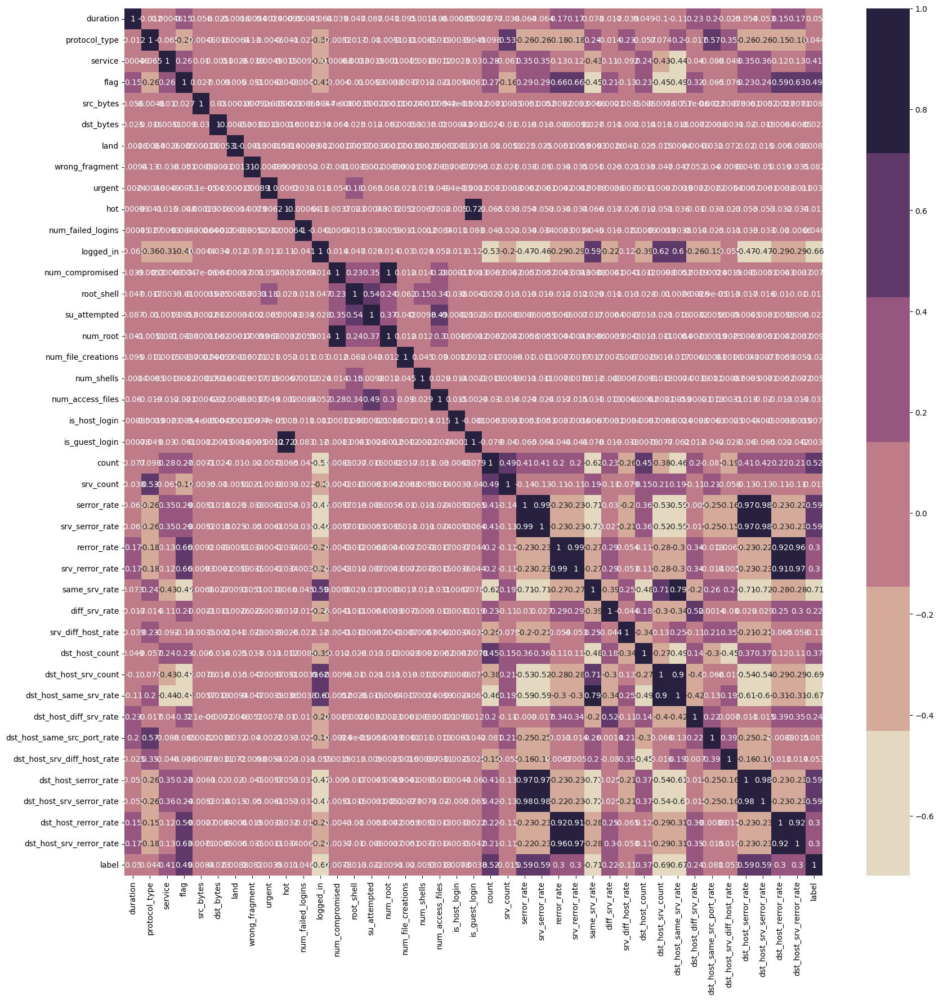

In [80]:
plt.figure(figsize=(20, 20))
sns.heatmap(corr, cmap=sns.color_palette("ch:s=-.2,r=.6"), annot=True)
plt.show()

cor_target = abs(corr["label"])
relevant_features = cor_target[cor_target > 0.2]
features = [index for index, value in relevant_features.items()]  # changed here
features.remove("label")


In [81]:
print (features)

['service', 'flag', 'logged_in', 'count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


In [82]:
print (len(features))

18


# Define data and labels

In [83]:
X_train = train[features]
y_train = train['label']
#y_train = train['label']
#del train['label']
#X_train = train

In [84]:
X_train.head()

,service,flag,logged_in,count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
0,0.086957,0.0,0.0,0.025440,0.0,0.0,0.0,0.0,0.08,0.15,1.000000,0.003922,0.00,0.60,0.00,0.00,0.0,0.00
1,0.014493,0.1,0.0,0.240705,1.0,1.0,0.0,0.0,0.05,0.07,1.000000,0.101961,0.10,0.05,1.00,1.00,0.0,0.00
2,0.000000,0.0,1.0,0.009785,0.2,0.2,0.0,0.0,1.00,0.00,0.117647,1.000000,1.00,0.00,0.03,0.01,0.0,0.01
3,0.000000,0.0,1.0,0.058708,0.0,0.0,0.0,0.0,1.00,0.00,1.000000,1.000000,1.00,0.00,0.00,0.00,0.0,0.00
4,0.014493,0.2,0.0,0.236791,0.0,0.0,1.0,1.0,0.16,0.06,1.000000,0.074510,0.07,0.07,0.00,0.00,1.0,1.00


In [85]:
y_train.head()

0    0.0
1    1.0
2    0.0
3    0.0
4    1.0
Name: label, dtype: float64

In [86]:
X_test = test[features]
y_test = test['label']
#y_test = test['label']
#del test['label']
#X_test = test

In [87]:
X_test.head()

,service,flag,logged_in,count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
0,0.015385,0.2,0.0,0.266145,0.0,0.00,1.0,1.0,0.01,0.06,1.000000,0.003922,0.00,0.06,0.00,0.0,1.00,1.00
1,0.061538,0.0,0.0,0.001957,0.0,0.00,0.0,0.0,1.00,0.00,0.525490,0.337255,0.61,0.04,0.00,0.0,0.00,0.00
2,0.076923,0.0,0.0,0.001957,0.0,0.00,0.0,0.0,1.00,0.00,0.011765,0.223529,1.00,0.00,0.00,0.0,0.00,0.00
3,0.123077,0.4,0.0,0.001957,0.0,0.12,1.0,0.5,1.00,0.00,0.113725,0.337255,0.31,0.17,0.00,0.0,0.83,0.71
4,0.000000,0.0,1.0,0.007828,0.0,0.00,0.0,0.0,1.00,0.00,0.607843,1.000000,1.00,0.00,0.01,0.0,0.00,0.00


In [88]:
y_test.head()

0    1.0
1    0.0
2    1.0
3    1.0
4    0.0
Name: label, dtype: float64

# Models performance evaluation

In [89]:
def train_evaluate_model(model, X_train, y_train, X_test,y_test):    
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    cm = confusion_matrix(y_test, predictions)
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    tn, fp, fn, tp = cm.ravel()
    false_alarm = fp / (fp + tn)
    eval_df = pd.DataFrame([[accuracy, f1, precision, recall, false_alarm]], columns=['accuracy', 'f1_score', 'precision', 'recall', 'false_alarme'])
    return model, cm, eval_df

# Logistic Regression

In [90]:
lg = LogisticRegression()
model_lg, cm_lg, results = train_evaluate_model(lg, X_train, y_train, X_test, y_test)

In [91]:
cm_lg

array([[8970,  741],
       [5303, 7529]])

In [92]:
cm_matrix = pd.DataFrame(data=cm_lg, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

<Axes: >

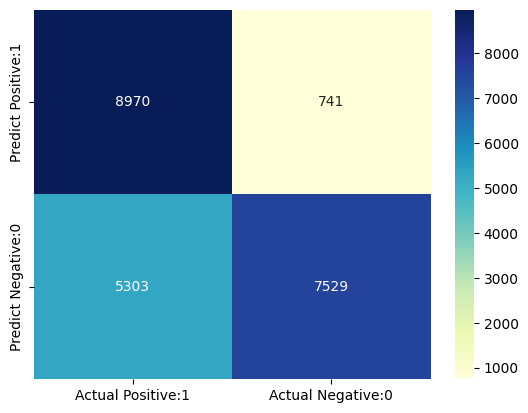

In [93]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
#disp = ConfusionMatrixDisplay(confusion_matrix=cm)
#disp.plot()
#plt.show()

In [94]:
results.index = ['LogisticRegression']

In [95]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression   0.73189  0.713582   0.910399  0.586736      0.076305


# Decision Tree

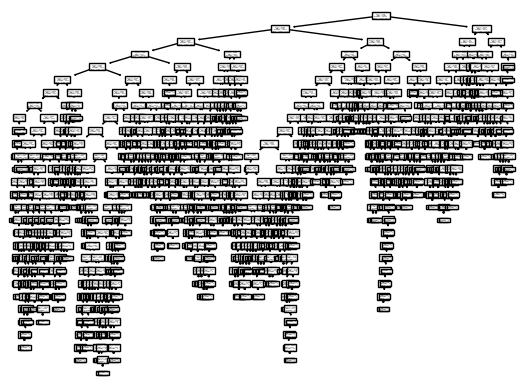

In [97]:
decision_tree = DecisionTreeClassifier()
model_tree, cm_dt, decision_tree_results = train_evaluate_model(decision_tree, X_train, y_train, X_test, y_test)

# Plotting the decision tree (ensure tree module is imported)
from sklearn import tree
tree.plot_tree(model_tree)

# Set the index name
decision_tree_results.index = ['DecisionTree']

# Concatenate the results
results = pd.concat([results, decision_tree_results])


In [98]:
cm_dt

array([[9342,  369],
       [4045, 8787]])

In [99]:
cm_matrix = pd.DataFrame(data=cm_dt, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

<Axes: >

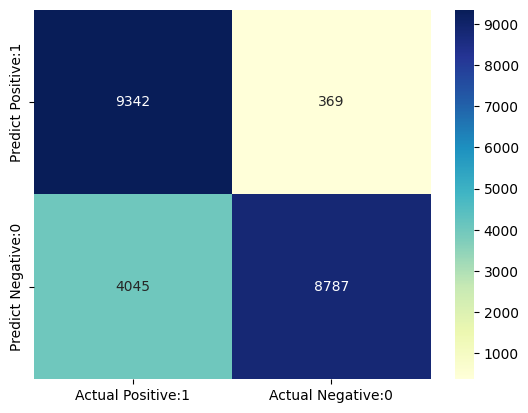

In [100]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [101]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression  0.731890  0.713582   0.910399  0.586736      0.076305
DecisionTree        0.804196  0.799254   0.959699  0.684772      0.037998


# KNearestNeighbors

In [102]:
KNN = KNeighborsClassifier(n_neighbors=7)

In [103]:
_, cm_knn, knn = train_evaluate_model(KNN, X_train, y_train, X_test, y_test)
knn.index =['KNearsNeighbors']
results = results.append(knn)

AttributeError: 'DataFrame' object has no attribute 'append'

In [ ]:
cm_knn

array([[9488,  223],
       [4135, 8697]], dtype=int64)

In [ ]:
cm_matrix = pd.DataFrame(data=cm_knn, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

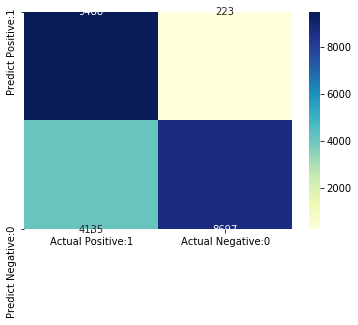

In [ ]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression  0.731491  0.713033   0.910301  0.586035      0.076305
DecisionTree        0.805838  0.801000   0.961366  0.686487      0.036454
KNearsNeighbors     0.806681  0.799651   0.975000  0.677759      0.022964


# Random Forest

In [ ]:
rfc = RandomForestClassifier()

In [ ]:
model_randomForest, cm_rf, rfc_result = train_evaluate_model(rfc, X_train, y_train, X_test, y_test)
rfc_result.index = ['RandomForest']

results = results.append(rfc_result)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



In [ ]:
cm_rf

array([[9451,  260],
       [4834, 7998]], dtype=int64)

In [ ]:
cm_matrix = pd.DataFrame(data=cm_rf, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

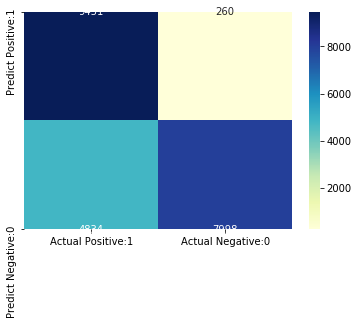

In [ ]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression  0.731491  0.713033   0.910301  0.586035      0.076305
DecisionTree        0.805838  0.801000   0.961366  0.686487      0.036454
KNearsNeighbors     0.806681  0.799651   0.975000  0.677759      0.022964
RandomForest        0.774032  0.758464   0.968515  0.623286      0.026774


# XGBoost

In [ ]:
xgboost = xgb.XGBClassifier()
model_xgboost, cm_xgb, xgboost_result = train_evaluate_model(xgboost, X_train, y_train, X_test, y_test)
xgboost_result.index = ['XGBoost']

results = results.append(xgboost_result)

In [ ]:
cm_xgb

array([[9377,  334],
       [4361, 8471]], dtype=int64)

In [ ]:
cm_matrix = pd.DataFrame(data=cm_xgb, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

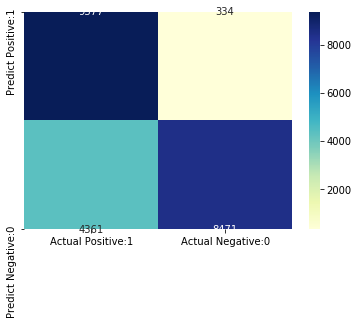

In [ ]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression  0.731491  0.713033   0.910301  0.586035      0.076305
DecisionTree        0.805838  0.801000   0.961366  0.686487      0.036454
KNearsNeighbors     0.806681  0.799651   0.975000  0.677759      0.022964
RandomForest        0.774032  0.758464   0.968515  0.623286      0.026774
XGBoost             0.791731  0.783011   0.962067  0.660147      0.034394


# Naive Bayes

In [ ]:
Naive_Bayes = GaussianNB()
model_Naive_Bayes, cm_nb, Naive_Bayes_result = train_evaluate_model(Naive_Bayes, X_train, y_train, X_test, y_test)
Naive_Bayes_result.index = ['NaiveBayes']

results = results.append(Naive_Bayes_result)

In [ ]:
cm_nb

array([[9052,  659],
       [4716, 8116]], dtype=int64)

In [ ]:
cm_matrix = pd.DataFrame(data=cm_nb, columns=['Actual Positive:1', 'Actual Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])

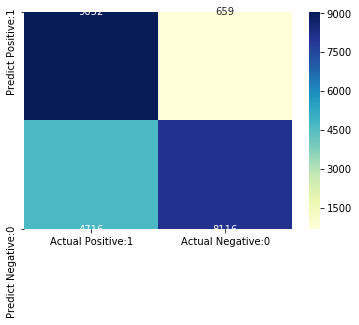

In [ ]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
print (results)

                    accuracy  f1_score  precision    recall  false_alarme
LogisticRegression  0.731491  0.713033   0.910301  0.586035      0.076305
DecisionTree        0.805838  0.801000   0.961366  0.686487      0.036454
KNearsNeighbors     0.806681  0.799651   0.975000  0.677759      0.022964
RandomForest        0.774032  0.758464   0.968515  0.623286      0.026774
XGBoost             0.791731  0.783011   0.962067  0.660147      0.034394
NaiveBayes          0.761567  0.751238   0.924900  0.632481      0.067861


# Summary

In [ ]:
models = results.T.columns.values
models= models[0:6]

In [ ]:
models

array(['LogisticRegression', 'DecisionTree', 'KNearsNeighbors',
       'RandomForest', 'XGBoost', 'NaiveBayes'], dtype=object)

In [ ]:
fig = px.bar(x=results.iloc[:7,0].values, y =models,orientation='h',color=results['accuracy'].iloc[:7],color_continuous_scale='tealrose',
            template="seaborn")

fig.update_layout(width=800, height=600,
                 xaxis=dict(title='Accuracy'),
                 yaxis=dict(title="Models"))

fig.show()

In [ ]:
fig = px.bar(x=results.iloc[:7,1].values, y =models,orientation='h',color=results['accuracy'].iloc[:7],color_continuous_scale='tealrose',
            template="seaborn")

fig.update_layout(width=800, height=600,
                 xaxis=dict(title='F1_Score'),
                 yaxis=dict(title="Models"))

fig.show()

In [ ]:
fig = px.bar(x=results.iloc[:7,2].values, y =models,orientation='h',color=results['precision'].iloc[:7],color_continuous_scale='tealrose',
            template="seaborn")

fig.update_layout(width=800, height=600,
                 xaxis=dict(title='Precision'),
                 yaxis=dict(title="Models"))

fig.show()

In [ ]:
fig = px.bar(x=results.iloc[:7,3].values, y =models,orientation='h',color=results['recall'].iloc[:7],color_continuous_scale='tealrose',
            template="seaborn")

fig.update_layout(width=800, height=600,
                 xaxis=dict(title='Recall'),
                 yaxis=dict(title="Models"))

fig.show()

In [ ]:
fig = px.bar(x=results.iloc[:7,4].values, y =models,orientation='h',color=results['false_alarme'].iloc[:7],color_continuous_scale='tealrose',
            template="seaborn")

fig.update_layout(width=800, height=600,
                 xaxis=dict(title='False alarme'),
                 yaxis=dict(title="Models"))

fig.show()